<a href="https://colab.research.google.com/github/shishir-sh26/port/blob/main/1dcnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_8525.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_6058.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_6158.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_6609.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_5430.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_4412.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_7421.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_8899.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_1718.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_4176.npy
/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002/mfcc/Sunny/Sunny_aug_1686.npy
/kaggle/input/mfcc-bird-sound/mf

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.utils import Sequence, to_categorical
from tensorflow.keras import layers, models

# -----------------------------
# Dataset folders (MFCC)
# -----------------------------
base_dirs = [
    '/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-001',
    '/kaggle/input/mfcc-bird-sound/mfcc-20250820T064032Z-1-002'
]

# -----------------------------
# Gather all .npy files and labels
# -----------------------------
all_files = []
all_labels = []
classes = set()

for base_dir in base_dirs:
    mfcc_folder = os.path.join(base_dir, 'mfcc')
    for cls in os.listdir(mfcc_folder):
        cls_folder = os.path.join(mfcc_folder, cls)
        if os.path.isdir(cls_folder):
            classes.add(cls)
            for file in os.listdir(cls_folder):
                if file.endswith('.npy'):
                    all_files.append(os.path.join(cls_folder, file))
                    all_labels.append(cls)

classes = sorted(list(classes))
class_to_idx = {cls: idx for idx, cls in enumerate(classes)}
all_labels_int = [class_to_idx[c] for c in all_labels]

print("Classes:", classes)
print("Total samples:", len(all_files))

# -----------------------------
# Train-test split (80k / 20k)
# -----------------------------
total_samples = len(all_files)
if total_samples < 100000:
    raise ValueError(f"Dataset has only {total_samples} samples. Need at least 100,000 for 80k/20k split.")

indices = np.arange(total_samples)
np.random.shuffle(indices)

all_files = np.array(all_files)[indices]
all_labels_int = np.array(all_labels_int)[indices]

train_files = all_files[:80000]
train_labels = all_labels_int[:80000]

test_files = all_files[80000:100000]
test_labels = all_labels_int[80000:100000]

print("Train samples:", len(train_files))
print("Test samples:", len(test_files))

# -----------------------------
# Custom generator for MFCCs
# -----------------------------
class NpyDataGenerator(Sequence):
    def __init__(self, file_list, labels, batch_size=16, shuffle=True):
        self.file_list = list(file_list)
        self.labels = list(labels)
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.file_list) / self.batch_size))

    def __getitem__(self, idx):
        batch_files = self.file_list[idx*self.batch_size:(idx+1)*self.batch_size]
        batch_labels = [self.labels[i] for i in range(idx*self.batch_size, min((idx+1)*self.batch_size, len(self.file_list)))]

        X, y_labels = [], []
        for f, label in zip(batch_files, batch_labels):
            try:
                data = np.load(f)  # (time, mfcc_features)
                data_resized = tf.image.resize(data[..., np.newaxis], [128, 40]).numpy()
                data_final = np.squeeze(data_resized)  # (128, 40)
                X.append(data_final)
                y_labels.append(label)
            except Exception as e:
                print(f"Warning: Skipping corrupted file {f}, error: {e}")
                continue

        if len(X) == 0:
            return self.__getitem__((idx + 1) % self.__len__())

        X = np.array(X)
        y = to_categorical(y_labels, num_classes=len(classes))
        return X, y

    def on_epoch_end(self):
        if self.shuffle:
            combined = list(zip(self.file_list, self.labels))
            np.random.shuffle(combined)
            self.file_list, self.labels = zip(*combined)

batch_size = 32
train_gen = NpyDataGenerator(train_files, train_labels, batch_size=batch_size)
test_gen = NpyDataGenerator(test_files, test_labels, batch_size=batch_size, shuffle=False)

# -----------------------------
# 1D CNN Model for MFCC
# -----------------------------
input_shape = (128, 40)

model = models.Sequential([
    layers.Conv1D(32, 3, activation='relu', padding='same', input_shape=input_shape),
    layers.BatchNormalization(),
    layers.MaxPooling1D(2),

    layers.Conv1D(64, 3, activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.MaxPooling1D(2),

    layers.Conv1D(128, 3, activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.GlobalAveragePooling1D(),

    layers.Dense(64, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(len(classes), activation='softmax')
])

model.compile(
    optimizer=tf.keras.optimizers.Adam(0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

# -----------------------------
# Train with checkpoint
# -----------------------------
checkpoint = tf.keras.callbacks.ModelCheckpoint(
    '/kaggle/working/1dcnn_mfcc_best.h5',
    monitor='val_accuracy',
    save_best_only=True,
    mode='max'
)

history = model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=15,
    callbacks=[checkpoint]
)

# Save final model
model.save('/kaggle/working/1dcnn_mfcc_final.h5')


2025-08-21 07:53:28.051564: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1755762808.467652      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1755762808.597009      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Classes: ['Cloudy', 'Foggy', 'Rainy', 'Sunny', 'Windy']
Total samples: 100836
Train samples: 80000
Test samples: 20000


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-08-21 07:53:53.778116: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 128, 32)        │         3,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 32)        │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 64, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 64, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 32, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 32, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 128)        │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,261 (172.89 KB)

 Trainable params: 43,813 (171.14 KB)

 Non-trainable params: 448 (1.75 KB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 828s 328ms/step - accuracy: 0.3701 - loss: 1.4288 - val_accuracy: 0.4728 - val_loss: 1.2361
Epoch 2/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 372s 149ms/step - accuracy: 0.4983 - loss: 1.1908 - val_accuracy: 0.5501 - val_loss: 1.0697
Epoch 3/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 321s 124ms/step - accuracy: 0.5446 - loss: 1.0840 - val_accuracy: 0.5732 - val_loss: 1.0311
Epoch 4/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 324s 129ms/step - accuracy: 0.5731 - loss: 1.0194 - val_accuracy: 0.6058 - val_loss: 0.9366
Epoch 5/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 301s 120ms/step - accuracy: 0.5959 - loss: 0.9627 - val_accuracy: 0.6017 - val_loss: 0.9442
Epoch 6/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 305s 122ms/step - accuracy: 0.6306 - loss: 0.8862 - val_accuracy: 0.6158 - val_loss: 0.9268
Epoch 8/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 309s 124ms/step - accuracy: 0.6387 - loss: 0.8591 - val_accuracy: 0.6544 - val_loss: 0.8263
Epoch 9/15
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 292s 117ms/step - ac

In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt

# ============================
# 1. Evaluate model on test data
# ============================
test_loss, test_acc = model.evaluate(test_gen, verbose=0)

print(f"Testing Loss: {test_loss:.4f}")
print(f"Testing Accuracy: {test_acc:.4f}")

# ============================
# 2. Get predictions
# ============================
y_true = test_gen.classes
y_prob = model.predict(test_gen, verbose=1)
y_pred = np.argmax(y_prob, axis=1)

# ============================
# 3. Classification Report
# ============================
target_names = list(test_gen.class_indices.keys())
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))

# ============================
# 4. Confusion Matrix
# ============================
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,5))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.colorbar()
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# ============================
# 5. ROC Curve (One-vs-Rest)
# ============================
from sklearn.preprocessing import label_binarize
n_classes = len(target_names)
y_true_bin = label_binarize(y_true, classes=list(range(n_classes)))

plt.figure(figsize=(6,5))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{target_names[i]} (AUC={roc_auc:.2f})")

plt.plot([0,1], [0,1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


Testing Loss: 0.7919
Testing Accuracy: 0.6786


AttributeError: 'NpyDataGenerator' object has no attribute 'classes'

Test Loss: 0.7919
Test Accuracy: 0.6786

Classification Report:

              precision    recall  f1-score   support

           0       0.57      0.46      0.51      3947
           1       0.73      0.93      0.82      3927
           2       0.74      0.60      0.66      4174
           3       0.73      0.68      0.70      3948
           4       0.61      0.72      0.66      4004

    accuracy                           0.68     20000
   macro avg       0.68      0.68      0.67     20000
weighted avg       0.68      0.68      0.67     20000



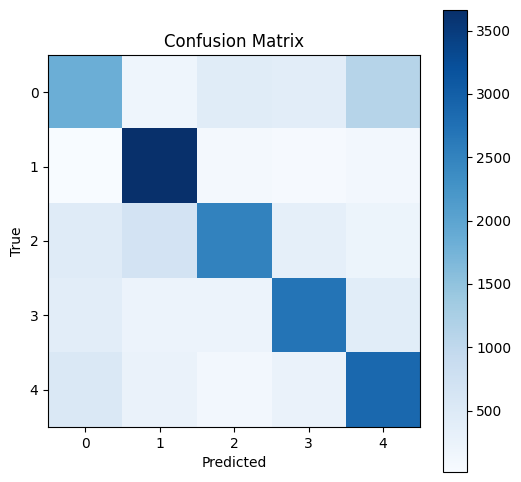

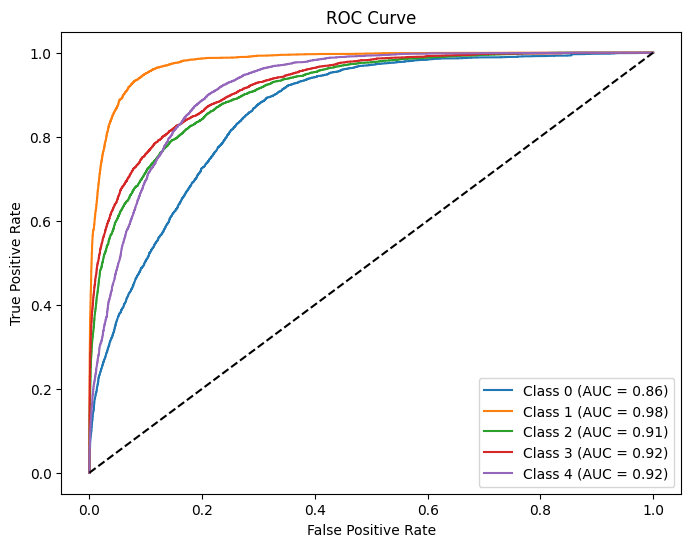

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# ============================
# 1. Evaluate model on test set
# ============================
test_loss, test_acc = model.evaluate(test_gen, verbose=0)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")

# ============================
# 2. Predictions
# ============================
y_true = []
y_pred = []
y_prob = []

for batch_x, batch_y in test_gen:
    preds = model.predict(batch_x, verbose=0)
    y_prob.extend(preds)
    y_pred.extend(np.argmax(preds, axis=1))
    y_true.extend(np.argmax(batch_y, axis=1))

    if len(y_true) >= len(test_gen.labels):
        break

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_prob = np.array(y_prob)

# ============================
# 3. Classification report
# ============================
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred))

# ============================
# 4. Confusion Matrix
# ============================
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,6))
plt.imshow(cm, cmap="Blues")
plt.title("Confusion Matrix")
plt.colorbar()
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# ============================
# 5. ROC Curve & AUC
# ============================
classes = np.arange(y_prob.shape[1])
y_true_bin = label_binarize(y_true, classes=classes)

fpr, tpr, roc_auc = {}, {}, {}
for i in range(len(classes)):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(8,6))
for i in range(len(classes)):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

plt.plot([0,1], [0,1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# ============================
# Training History Plots
# ============================

# Loss Plot
plt.figure(figsize=(8,6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training & Validation Loss')
plt.legend()
plt.savefig("loss_curve.png", dpi=300, bbox_inches="tight")
plt.close()
print("Loss curve saved as loss_curve.png")

# Accuracy Plot
plt.figure(figsize=(8,6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training & Validation Accuracy')
plt.legend()
plt.savefig("accuracy_curve.png", dpi=300, bbox_inches="tight")
plt.close()
print("Accuracy curve saved as accuracy_curve.png")


Loss curve saved as loss_curve.png
Accuracy curve saved as accuracy_curve.png


In [ ]:
# ✅ Use the already trained model (skip load_model)
# model = tf.keras.models.load_model("/kaggle/working/final_model.h5")  # ❌ Remove this

# Freeze all layers except last 2
for layer in model.layers[:-2]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC(name="auc")]
)


In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping

print("✅ Step 1: Freezing layers...")

# Freeze all layers except the last 2
for layer in model.layers[:-2]:
    layer.trainable = False
for layer in model.layers[-2:]:
    layer.trainable = True

# Re-compile with very small LR
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC()]
)

print("✅ Step 2: Model recompiled for fine-tuning!")

# Setup early stopping
early_stop = EarlyStopping(monitor="val_loss", patience=2, restore_best_weights=True)

print("✅ Step 3: Fine-tuning started...")

# 🔹 Replace with your dataset variable names
fine_tune_history = model.fit(
    train_gen,             # 👈 use your training generator/dataset name
    validation_data=val_gen,   # 👈 use your validation generator/dataset name
    epochs=5,
    callbacks=[early_stop],
    verbose=1
)

print("🎉 Step 4: Fine-tuning finished successfully!")


✅ Step 1: Freezing layers...
✅ Step 2: Model recompiled for fine-tuning!
✅ Step 3: Fine-tuning started...


NameError: name 'val_gen' is not defined

In [ ]:
# 🔍 List all variables in memory so we can see dataset names
print([var for var in globals().keys() if "ds" in var or "gen" in var])


['train_gen', 'test_gen', 'preds']


In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping

print("✅ Step 1: Freezing layers...")
for layer in model.layers[:-2]:
    layer.trainable = False

print("✅ Step 2: Recompiling model for fine-tuning...")
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # smaller LR for fine-tuning
    loss="categorical_crossentropy",
    metrics=["accuracy", tf.keras.metrics.AUC(name="auc")]
)

early_stop = EarlyStopping(monitor="val_loss", patience=2, restore_best_weights=True)

print("✅ Step 3: Fine-tuning started...")
fine_tune_history = model.fit(
    train_gen,
    validation_data=test_gen,
    epochs=5,   # increase if you want
    callbacks=[early_stop],
    verbose=1
)

print("🎉 Fine-tuning completed!")


✅ Step 1: Freezing layers...
✅ Step 2: Recompiling model for fine-tuning...
✅ Step 3: Fine-tuning started...
Epoch 1/5
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 722s 288ms/step - accuracy: 0.2662 - auc: 0.5895 - loss: 1.5643 - val_accuracy: 0.3225 - val_auc: 0.6445 - val_loss: 1.5412
Epoch 2/5
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 529s 211ms/step - accuracy: 0.2727 - auc: 0.5956 - loss: 1.5602 - val_accuracy: 0.3255 - val_auc: 0.6501 - val_loss: 1.5370
Epoch 3/5
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 548s 219ms/step - accuracy: 0.2744 - auc: 0.6006 - loss: 1.5573 - val_accuracy: 0.3257 - val_auc: 0.6558 - val_loss: 1.5336
Epoch 4/5
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 559s 223ms/step - accuracy: 0.2700 - auc: 0.5988 - loss: 1.5586 - val_accuracy: 0.3284 - val_auc: 0.6591 - val_loss: 1.5307
Epoch 5/5
2500/2500 ━━━━━━━━━━━━━━━━━━━━ 526s 210ms/step - accuracy: 0.2745 - auc: 0.6031 - loss: 1.5533 - val_accuracy: 0.3286 - val_auc: 0.6614 - val_loss: 1.5282
🎉 Fine-tuning completed!


In [ ]:
# Save entire fine-tuned model
model.save("fine_tuned_model.h5")
print("✅ Fine-tuned model saved as fine_tuned_model.h5")

# Save weights only (must end with `.weights.h5`)
model.save_weights("fine_tuned_model.weights.h5")
print("✅ Fine-tuned weights saved as fine_tuned_model.weights.h5")


✅ Fine-tuned model saved as fine_tuned_model.h5
✅ Fine-tuned weights saved as fine_tuned_model.weights.h5


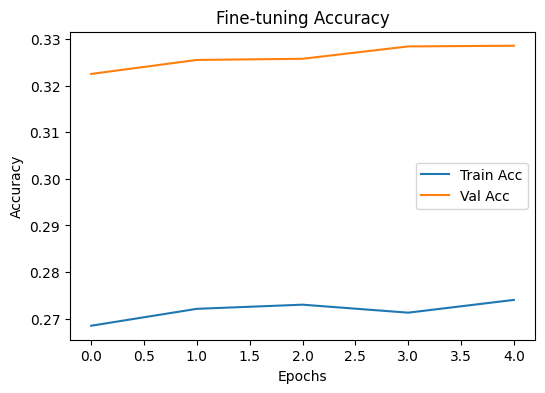

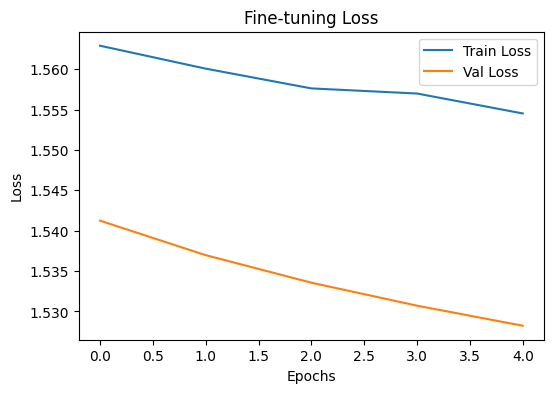

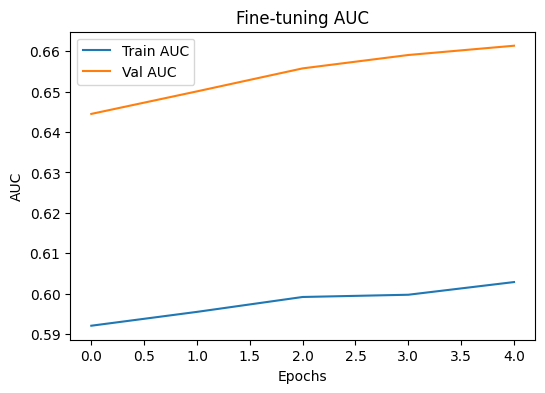

In [ ]:
import matplotlib.pyplot as plt

# Extract history
history = fine_tune_history.history

# Accuracy plot
plt.figure(figsize=(6,4))
plt.plot(history['accuracy'], label="Train Acc")
plt.plot(history['val_accuracy'], label="Val Acc")
plt.title("Fine-tuning Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# Loss plot
plt.figure(figsize=(6,4))
plt.plot(history['loss'], label="Train Loss")
plt.plot(history['val_loss'], label="Val Loss")
plt.title("Fine-tuning Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# AUC plot
plt.figure(figsize=(6,4))
plt.plot(history['auc'], label="Train AUC")
plt.plot(history['val_auc'], label="Val AUC")
plt.title("Fine-tuning AUC")
plt.xlabel("Epochs")
plt.ylabel("AUC")
plt.legend()
plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import sys

print("🔍 Generating predictions...")

y_true = []
y_pred_probs = []

n_batches = len(test_gen)   # total batches
for i, (batch_x, batch_y) in enumerate(test_gen, 1):
    y_true.extend(np.argmax(batch_y, axis=1))
    preds = model.predict(batch_x, verbose=0)
    y_pred_probs.extend(np.argmax(preds, axis=1))

    # Progress percentage
    pct = (i / n_batches) * 100
    sys.stdout.write(f"\r⏳ Progress: {pct:.2f}%")
    sys.stdout.flush()

    if i >= n_batches:  # ✅ stop after one epoch
        break

print("\n✅ Prediction loop completed!")

# Convert to arrays
y_true = np.array(y_true)
y_pred_classes = np.array(y_pred_probs)

# ✅ Get class names from train_gen
try:
    class_names = list(train_gen.class_indices.keys())
except:
    class_names = [f"Class {i}" for i in range(len(np.unique(y_true)))]  # fallback

# ✅ Classification report
print("\n📊 Classification Report:")
report = classification_report(y_true, y_pred_classes, target_names=class_names)
print(report)

with open("classification_report.txt", "w") as f:
    f.write(report)
print("✅ Classification report saved as classification_report.txt")

# ✅ Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(8, 6))
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix")
plt.savefig("confusion_matrix.png")
plt.show()

print("✅ Confusion matrix saved as confusion_matrix.png")


🔍 Generating predictions...
⏳ Progress: 40.96%